<a href="https://colab.research.google.com/github/khonkaen-iot/defect-detection/blob/main/DogBreedsProject_video_EP3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#0.Load datset & install YOLO

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install ultralytics -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 606.9/606.9 kB 7.2 MB/s eta 0:00:00


In [ ]:
!mkdir ~/.kaggle
!cp /content/drive/MyDrive/kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [ ]:
!pwd

/content


In [ ]:
!kaggle datasets download jessicali9530/stanford-dogs-dataset

 99% 746M/750M [00:21<00:00, 38.5MB/s]
100% 750M/750M [00:21<00:00, 37.2MB/s]


In [ ]:
!unzip -q /content/stanford-dogs-dataset.zip

#1.Preparation Datasets

In [ ]:
import os

source_dir = '/content/images/Images'

img_paths = []

for root , dir, files in os.walk(source_dir):
  for file in files:
    file_path = os.path.join(root,file)
    img_paths.append(file_path)
print(len(img_paths))

20580


In [ ]:
import os

source_dir = '/content/annotations/Annotation'

anno_paths = []

for root , dir, files in os.walk(source_dir):
  for file in files:
    file_path = os.path.join(root,file)
    anno_paths.append(file_path)
print(len(anno_paths))

20580


In [ ]:
img_paths[:3]

['/content/images/Images/n02108551-Tibetan_mastiff/n02108551_8943.jpg',
 '/content/images/Images/n02108551-Tibetan_mastiff/n02108551_1240.jpg',
 '/content/images/Images/n02108551-Tibetan_mastiff/n02108551_4820.jpg']

In [ ]:
img_paths[-3:]

['/content/images/Images/n02089973-English_foxhound/n02089973_2345.jpg',
 '/content/images/Images/n02089973-English_foxhound/n02089973_2045.jpg',
 '/content/images/Images/n02089973-English_foxhound/n02089973_1132.jpg']

In [ ]:
# !mkdir aa

In [ ]:
# import shutil
# source_file = '/content/images/Images/n02085620-Chihuahua/n02085620_10074.jpg'
# destination = '/content/aa/n02085620_10074.jpg'
# shutil.copy2(source_file,destination)

In [ ]:
# import shutil
# source_file = '/content/images/Images/n02085620-Chihuahua/n02085620_10074.jpg'
# destination = '/content/aa'

In [ ]:
# des_path = source_file.replace('/content/images/Images/n02085620-Chihuahua',destination )
# des_path

In [ ]:
# import shutil
# source_file = '/content/images/Images/n02085620-Chihuahua/n02085620_10074.jpg'
# destination = '/content/aa'

In [ ]:
# source_file.split('/')

In [ ]:
# source_file.split('/')[-1]

In [ ]:
# true_des =  destination+'/' + source_file.split('/')[-1]
# true_des

In [ ]:
##os
import os

In [ ]:
!pwd

/content


In [ ]:
os.getcwd()

'/content'

In [ ]:
# source_file

In [ ]:
# f_name = os.path.basename(source_file)
# f_name

In [ ]:
# destination

In [ ]:
# os.path.join(destination,f_name )

In [ ]:
##Pathlib

In [ ]:
# !mkdir a2

In [ ]:
# import shutil
# source_file = '/content/images/Images/n02085620-Chihuahua/n02085620_10074.jpg'
# dest_folder = '/content/a2'
# dest_path = os.path.join(dest_folder, os.path.basename(source_file))
# shutil.copy2(source_file,dest_path)

In [ ]:
# img_paths[0]

In [ ]:
# !mkdir -p data/images

In [ ]:
import os

source_dir = '/content/images/Images'

img_paths = []

for root , dir, files in os.walk(source_dir):
  for file in files:
    file_path = os.path.join(root,file)
    img_paths.append(file_path)
print(len(img_paths))

20580


In [ ]:
img_paths[0]

'/content/images/Images/n02108551-Tibetan_mastiff/n02108551_8943.jpg'

In [ ]:
## Real copy
import shutil

dest_folder = '/content/data/images'

os.makedirs(dest_folder, exist_ok=True)

for img_path in img_paths:
  dest_path = os.path.join(dest_folder, os.path.basename(img_path))
  shutil.copy2(img_path, dest_path)


In [ ]:
import os

source_dir = '/content/data/images'

img_paths = []

for root , dir, files in os.walk(source_dir):
  for file in files:
    file_path = os.path.join(root,file)
    img_paths.append(file_path)
print(len(img_paths))

20580


In [ ]:
len(anno_paths)

20580

In [ ]:
anno_paths[0]

'/content/annotations/Annotation/n02108551-Tibetan_mastiff/n02108551_978'

In [ ]:
## Real copy labels
dest_folder = '/content/data/labels'

os.makedirs(dest_folder, exist_ok=True)

for anno_path in anno_paths:
  dest_path = os.path.join(dest_folder, os.path.basename(anno_path))
  shutil.copy2(anno_path, dest_path)

In [ ]:
# Check no. of files
import os

source_dir = '/content/data/images'

img_paths = []

for root , dir, files in os.walk(source_dir):
  for file in files:
    file_path = os.path.join(root,file)
    img_paths.append(file_path)
print(len(img_paths))

20580


In [ ]:
# Check no. of files of labels
import os

source_dir = '/content/data/labels'

lable_paths = []

for root , dir, files in os.walk(source_dir):
  for file in files:
    file_path = os.path.join(root,file)
    lable_paths.append(file_path)
print(len(lable_paths))

20580


In [ ]:
img_paths[:3]

['/content/data/images/n02091032_11998.jpg',
 '/content/data/images/n02091032_1679.jpg',
 '/content/data/images/n02104029_2417.jpg']

In [ ]:
lable_paths[:3]

['/content/data/labels/n02096051_517',
 '/content/data/labels/n02088466_8820',
 '/content/data/labels/n02090379_709']

In [ ]:
20580*2


41160

##EP.2

In [ ]:
#Sampling annotation file
file_path = '/content/data/labels/n02085620_10074'

with open(file_path, 'r') as file :
  content = file.read()
print(content)


<annotation>
	<folder>02085620</folder>
	<filename>n02085620_10074</filename>
	<source>
		<database>ImageNet database</database>
	</source>
	<size>
		<width>333</width>
		<height>500</height>
		<depth>3</depth>
	</size>
	<segment>0</segment>
	<object>
		<name>Chihuahua</name>
		<pose>Unspecified</pose>
		<truncated>0</truncated>
		<difficult>0</difficult>
		<bndbox>
			<xmin>25</xmin>
			<ymin>10</ymin>
			<xmax>276</xmax>
			<ymax>498</ymax>
		</bndbox>
	</object>
</annotation>


#XML File read

In [ ]:
# import xml.etree.ElementTree as ET

# xml_path = '/content/data/labels/n02085620_10074'
# tree = ET.parse(xml_path)
# root = tree.getroot()

# for item in root.findall('size'):
#   width = int(item.find('width').text)
#   height = int(item.find('height').text)
#   # print(width,height)


# yolo_lines = []
# for obj in root.findall('object'):
#   name = obj.find('name').text
#   bbox = obj.find('bndbox')

#   xmin =int(bbox.find('xmin').text)
#   ymin =int(bbox.find('ymin').text)
#   xmax =int(bbox.find('xmax').text)
#   ymax =int(bbox.find('ymax').text)
#   # print(xmin, ymin,xmax,ymax)

#   # convert bbox from xml to Yolo
#   x_center = (xmin+xmax) / (2.0 * width)
#   y_center = (ymin+ymax) / (2.0 *height)
#   box_width = (xmax-xmin) / width
#   box_height = (ymax-ymin) / height

#   # print(f"{name} {x_center:.6f} {y_center:.6f} {box_width:.6f} {box_height:6f}")
#   yolo_lines.append(f"{name} {x_center:.6f} {y_center:.6f} {box_width:.6f} {box_height:6f}")

# yolo_anno = "\n".join(yolo_lines)

# yolo_file_path = xml_path + '.txt'
# # print(yolo_file_path)

# with open(yolo_file_path, 'w') as f :
#   f.write(yolo_anno)


In [ ]:
import os

source_dir = '/content/images/Images'

class_names = []

for _ , dirs, _ in os.walk(source_dir):
  for dir in dirs:
    # print(dir[10:])
    class_names.append(dir[10:])
    class_names.sort()

In [ ]:
len(class_names)

120

In [ ]:
class_names[:5]

['Afghan_hound',
 'African_hunting_dog',
 'Airedale',
 'American_Staffordshire_terrier',
 'Appenzeller']

In [ ]:
class_names[-5:]

['toy_poodle', 'toy_terrier', 'vizsla', 'whippet', 'wire-haired_fox_terrier']

In [ ]:
class_names.index('vizsla')

117

In [ ]:
# import xml.etree.ElementTree as ET

# xml_path = '/content/data/labels/n02085620_10074'
# tree = ET.parse(xml_path)
# root = tree.getroot()

# for item in root.findall('size'):
#   width = int(item.find('width').text)
#   height = int(item.find('height').text)
#   # print(width,height)


# yolo_lines = []
# for obj in root.findall('object'):
#   name = obj.find('name').text

#   # Convert from name to idx
#   class_idx = class_names.index(name)

#   bbox = obj.find('bndbox')

#   xmin =int(bbox.find('xmin').text)
#   ymin =int(bbox.find('ymin').text)
#   xmax =int(bbox.find('xmax').text)
#   ymax =int(bbox.find('ymax').text)
#   # print(xmin, ymin,xmax,ymax)

#   # convert bbox from xml to Yolo
#   x_center = (xmin+xmax) / (2.0 * width)
#   y_center = (ymin+ymax) / (2.0 *height)
#   box_width = (xmax-xmin) / width
#   box_height = (ymax-ymin) / height

#   print(f"{class_idx} {x_center:.6f} {y_center:.6f} {box_width:.6f} {box_height:6f}")
#   yolo_lines.append(f"{class_idx} {x_center:.6f} {y_center:.6f} {box_width:.6f} {box_height:6f}")

# yolo_anno = "\n".join(yolo_lines)

# yolo_file_path = xml_path + '.txt'
# # print(yolo_file_path)

# with open(yolo_file_path, 'w') as f :
#   f.write(yolo_anno)


##Make function convert from xml to yolo format

In [ ]:
import xml.etree.ElementTree as ET

def xml_yolo(xml_path):
  '''
  xml_path : str (input xml path that need to change to yolo format)
  '''
  print(xml_path)
  tree = ET.parse(xml_path)
  root = tree.getroot()

  for item in root.findall('size'):
    width = int(item.find('width').text)
    height = int(item.find('height').text)
    # print(width,height)


  yolo_lines = []
  for obj in root.findall('object'):
    name = obj.find('name').text

    # Convert from name to idx
    class_idx = class_names.index(name)

    bbox = obj.find('bndbox')

    xmin =int(bbox.find('xmin').text)
    ymin =int(bbox.find('ymin').text)
    xmax =int(bbox.find('xmax').text)
    ymax =int(bbox.find('ymax').text)
    # print(xmin, ymin,xmax,ymax)

    # convert bbox from xml to Yolo
    x_center = (xmin+xmax) / (2.0 * width)
    y_center = (ymin+ymax) / (2.0 *height)
    box_width = (xmax-xmin) / width
    box_height = (ymax-ymin) / height

    # print(f"{class_idx} {x_center:.6f} {y_center:.6f} {box_width:.6f} {box_height:6f}")
    yolo_lines.append(f"{class_idx} {x_center:.6f} {y_center:.6f} {box_width:.6f} {box_height:6f}")

  yolo_anno = "\n".join(yolo_lines)

  yolo_file_path = xml_path + '.txt'
  # print(yolo_file_path)

  with open(yolo_file_path, 'w') as f :
    f.write(yolo_anno)

In [ ]:
# xml_path = '/content/data/labels/n02085620_10074'

In [ ]:
# xml_yolo(xml_path)

In [ ]:
import os

source_dir = '/content/data/labels'

anno_paths = []

for root , dir, files in os.walk(source_dir):
  for file in files:
    file_path = os.path.join(root,file)
    anno_paths.append(file_path)
print(len(anno_paths))

20580


In [ ]:
len(anno_paths)

20580

In [ ]:
anno_paths[0]

'/content/data/labels/n02096051_517'

In [ ]:
# convert all files
for anno_path in anno_paths:
  xml_yolo(anno_path)

Streaming output truncated to the last 5000 lines.
/content/data/labels/n02091831_4846
/content/data/labels/n02102040_3462
/content/data/labels/n02115641_12709
/content/data/labels/n02089867_3360
/content/data/labels/n02098413_6837
/content/data/labels/n02085936_126
/content/data/labels/n02111889_5769
/content/data/labels/n02108551_8370
/content/data/labels/n02107908_7232
/content/data/labels/n02097209_1387
/content/data/labels/n02097047_4634
/content/data/labels/n02096437_2350
/content/data/labels/n02107683_4697
/content/data/labels/n02108089_3547
/content/data/labels/n02105412_3979
/content/data/labels/n02105855_13382
/content/data/labels/n02097209_908
/content/data/labels/n02106662_2924
/content/data/labels/n02097474_3998
/content/data/labels/n02111277_11806
/content/data/labels/n02100735_7874
/content/data/labels/n02106662_19720
/content/data/labels/n02091467_6680
/content/data/labels/n02110806_673
/content/data/labels/n02105162_7376
/content/data/labels/n02091032_9018
/content/dat

#EP.3 Making Sampling data Yolo annotation file to vitullization

In [ ]:
import os

source_dir = '/content/data/labels'

anno_paths_all = []

for root , dir, files in os.walk(source_dir):
  for file in files:
    file_path = os.path.join(root,file)
    anno_paths_all.append(file_path)
print(len(anno_paths_all))

41160


##Making function for disply dog image with bboxes

In [ ]:
class_names[:10]

['Afghan_hound',
 'African_hunting_dog',
 'Airedale',
 'American_Staffordshire_terrier',
 'Appenzeller',
 'Australian_terrier',
 'Bedlington_terrier',
 'Bernese_mountain_dog',
 'Blenheim_spaniel',
 'Border_collie']

In [ ]:
#To do list
#1.Read annotation file
#2. Read image
#3.Write rectangle to image & class name
#4.Show image
# /content/data/images/123.jpg /content/data/labels/123.txt

In [98]:
import cv2
import matplotlib.pyplot as plt

def plot_image_with_bboxes(image_path, class_names):
  """
  image_path : str
  class_names : list
  """

  # Read annotation files
  annotation_path = image_path.replace('/images/', '/labels/').replace('.jpg', '.txt')

  with open(annotation_path, 'r') as f :
    anno = f.readlines()
  annotations = [line.strip().split() for line in anno]
  # print(annotations)

  #2.Reead imge
  image = cv2.imread(image_path)
  image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

  for annotation in annotations:
    class_idx , x_center, y_center, w_width, h_height = map(float, annotation)
    class_name = class_names[int(class_idx)]
    # print(class_name,x_center, y_center, w_width, h_height )

    # Convert nomallized to actual image size
    height , width , _  = image.shape
    # print(height , width)
    x_center = int(x_center * width)
    y_center = int(y_center * height)
    bbox_width = int(w_width * width)
    bbox_height = int( h_height* height)
    # print(x_center, y_center, bbox_width, bbox_height )

    # Calculate min max of box
    x_min = x_center - bbox_width//2
    y_min = y_center - bbox_height//2
    x_max = x_center + bbox_width//2
    y_max = y_center + bbox_height//2

    cv2.rectangle(image, (x_min, y_min), (x_max, y_max), (0, 255,0), 2)
    cv2.putText(image, class_name, (x_center ,y_center), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0,255,0),2)

  plt.imshow(image)
  # plt.axis('off')
  plt.show()



Chihuahua 0.451952 0.508 0.753754 0.976


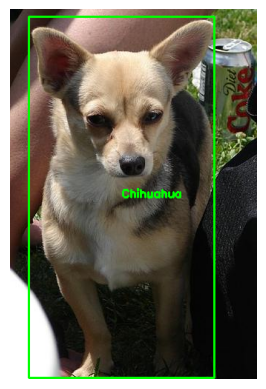

In [84]:
plot_image_with_bboxes('/content/data/images/n02085620_10074.jpg',class_names=class_names)

In [77]:
class_names[17]

'Chihuahua'

In [87]:
img_paths[:3]

['/content/data/images/n02091032_11998.jpg',
 '/content/data/images/n02091032_1679.jpg',
 '/content/data/images/n02104029_2417.jpg']

In [88]:
import random

def show_sample(n=3):
  sample_img = random.sample(img_paths, n)

  for img in sample_img:
    plot_image_with_bboxes(img, class_names)

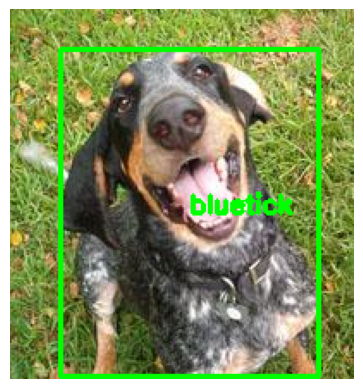

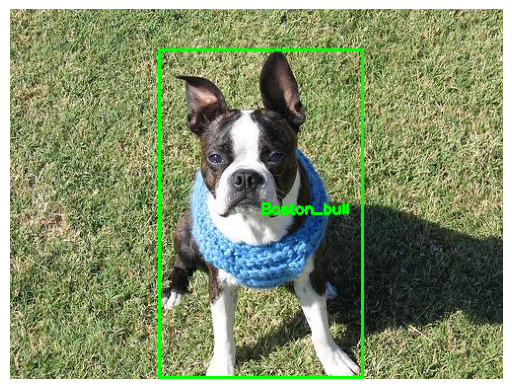

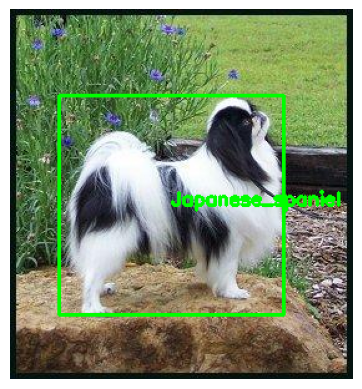

In [89]:
show_sample()

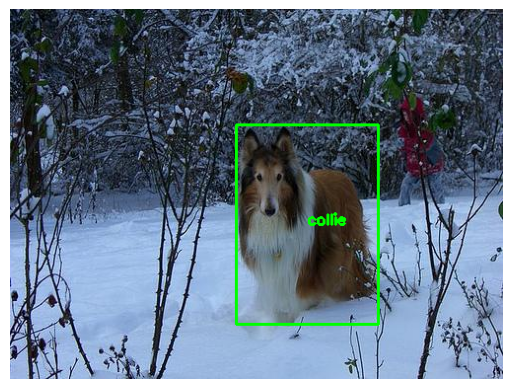

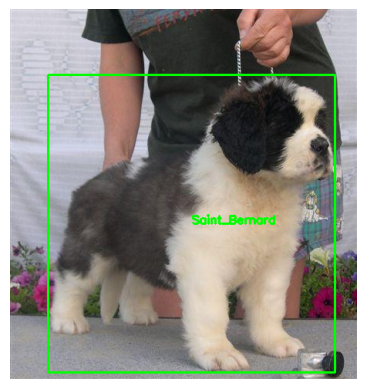

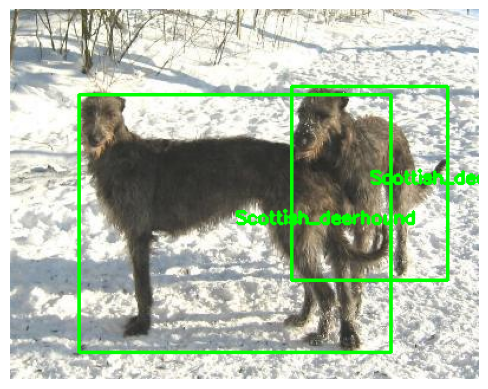

In [90]:
show_sample()

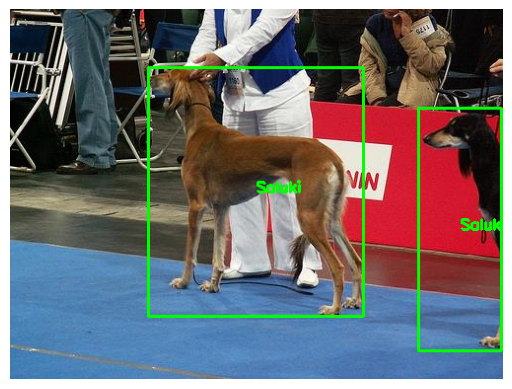

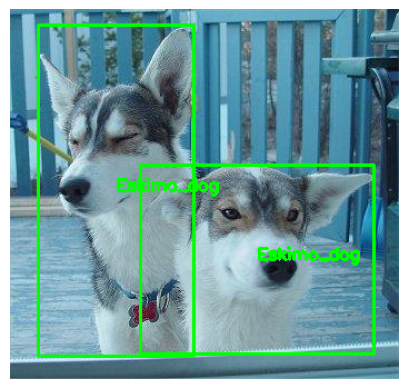

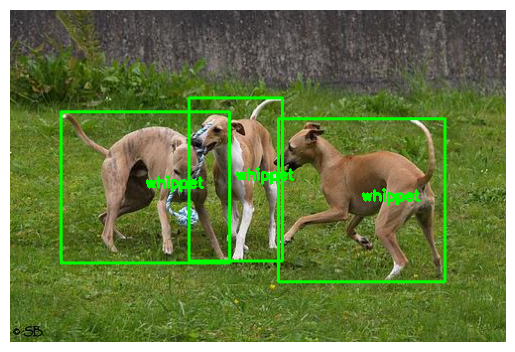

In [91]:
show_sample()

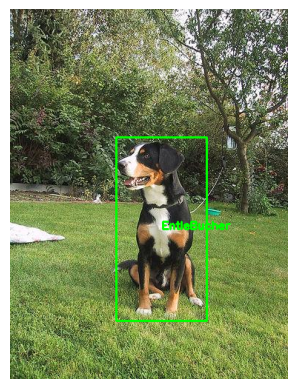

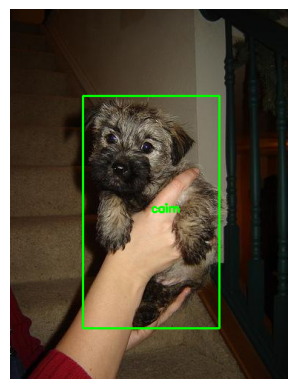

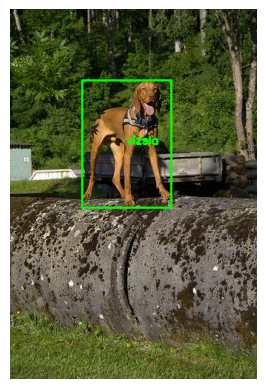

In [92]:
show_sample()

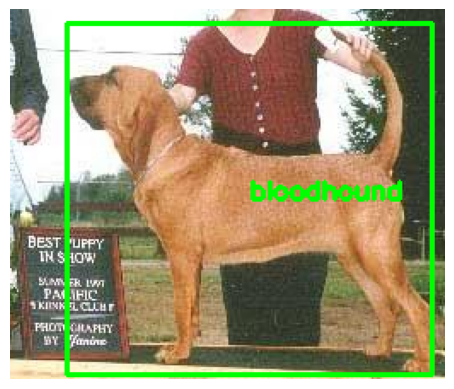

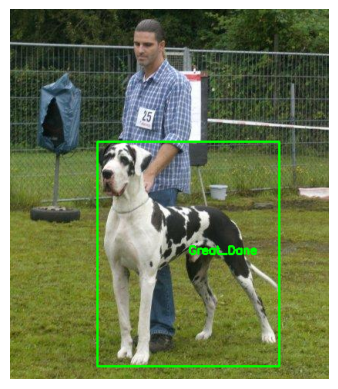

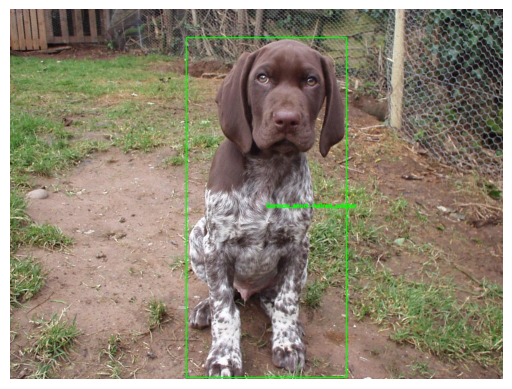

In [93]:
show_sample()

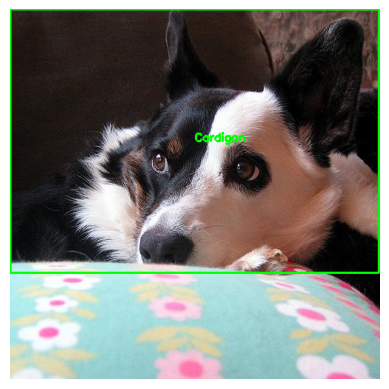

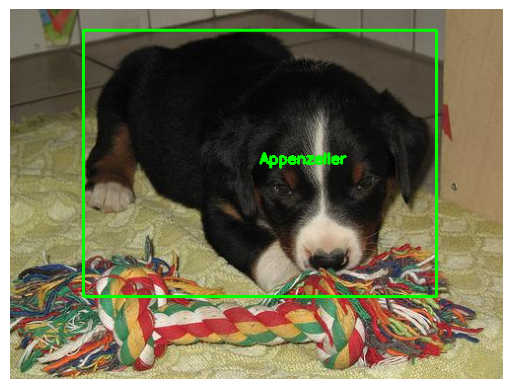

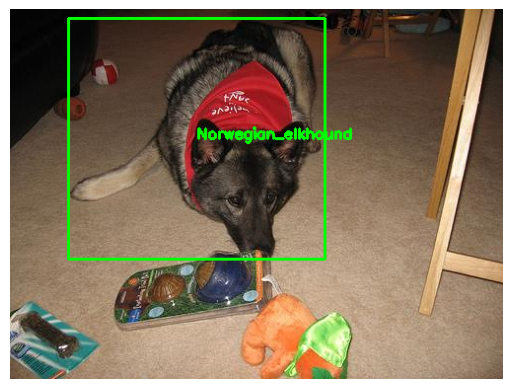

In [94]:
show_sample()

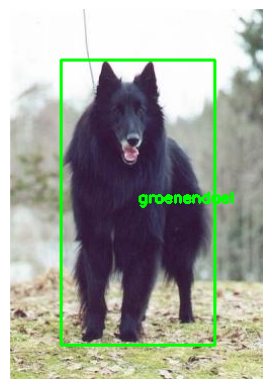

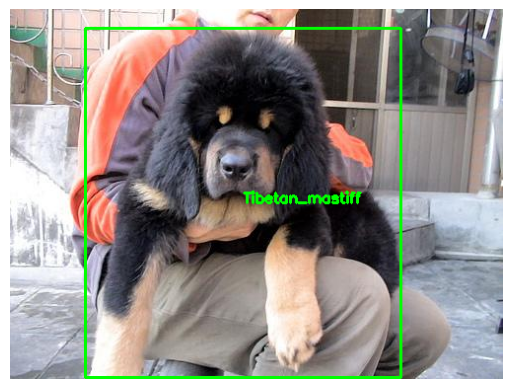

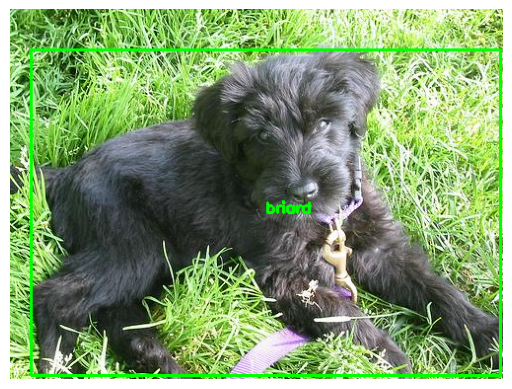

In [95]:
show_sample()

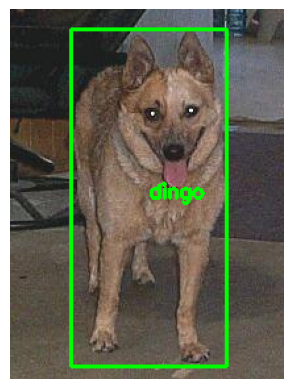

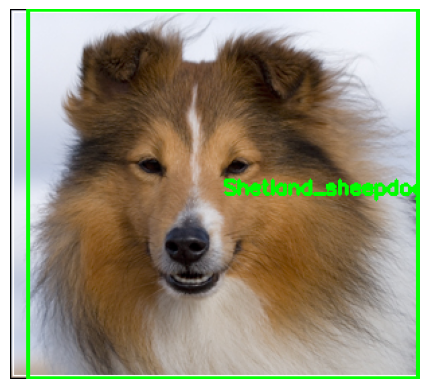

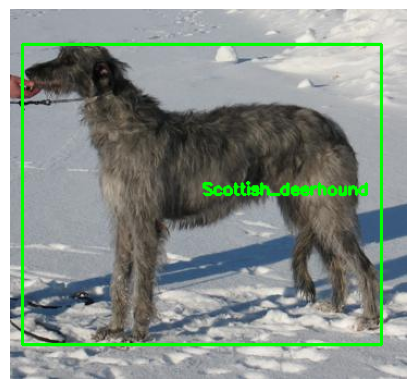

In [96]:
show_sample()

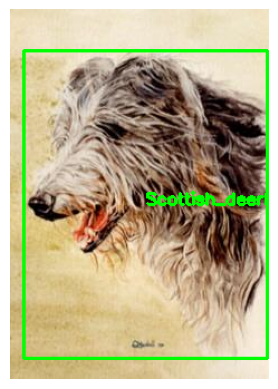

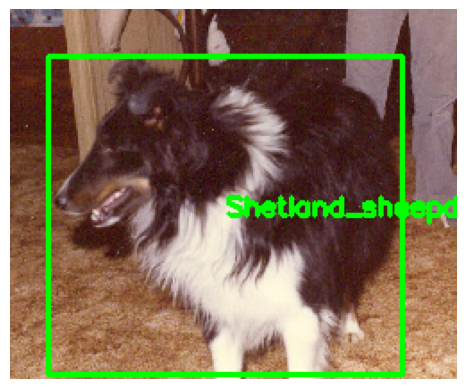

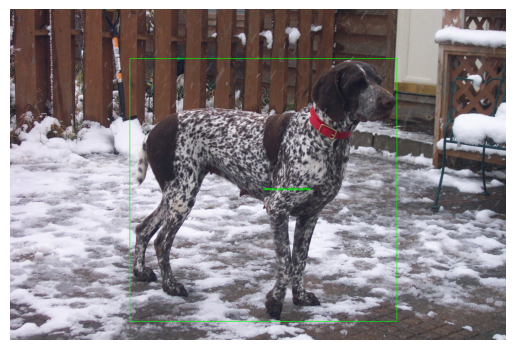

In [97]:
show_sample()

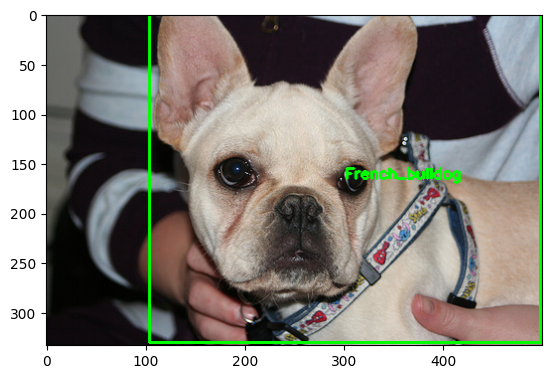

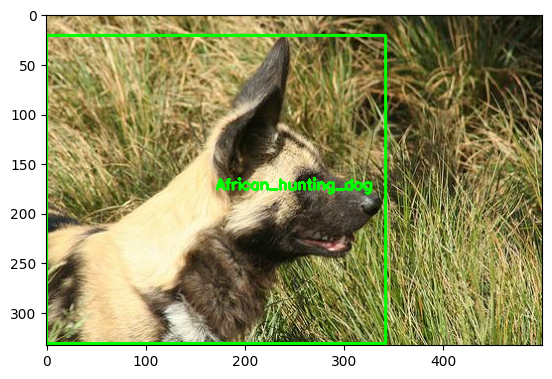

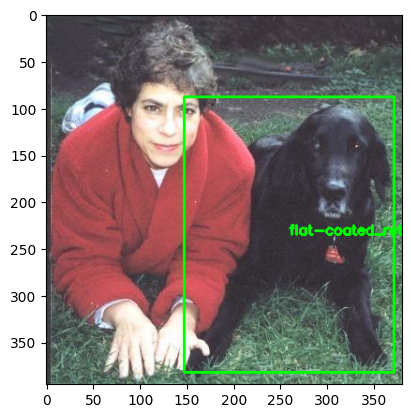

In [99]:
show_sample()

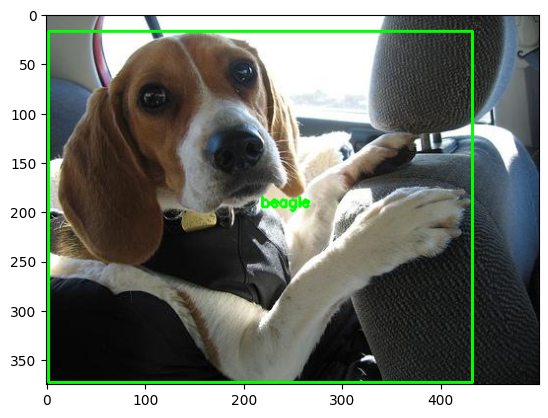

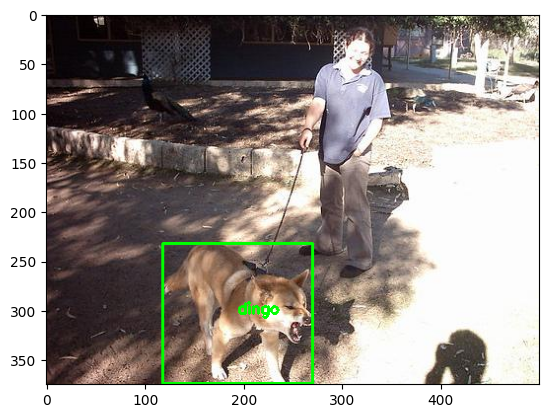

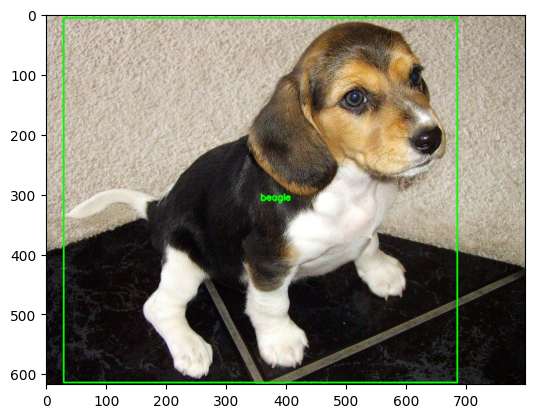

In [100]:
show_sample()